# Build TAVG = (Tmin+Tmax)*0.5 from GHCND data. 
# Tmin and Tmax data flagged by any of the following 'D|G|K|L|M|N|O|R|S|T|W|X|Z' are removed prior to plotting the timeseries.

In [91]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import scipy
import cftime
import cartopy
import cartopy.crs as ccrs
import matplotlib.colors as mpltcolors
import cmaps
from xhistogram.xarray import histogram
import geopandas as gpd
from matplotlib import cm
import functions_utils

In [92]:
from scipy.signal import find_peaks, argrelextrema

In [93]:
import warnings
warnings.filterwarnings('ignore')

In [94]:

def calculate_bilotta_afi(temp, units='F'):
    """
    Calculate Air Freezing Index (AFI) using the Bilotta et al. (2015) methodology.

    This methodology calculates the AFI as the difference between the highest and lowest
    extrema points in the cumulative freezing degree-days curve over a cold season.

    Parameters:
    -----------
    temp : temperature timeserie for the specific cold season

    Returns:
    --------
    xarray.DataArray
        Seasonal AFI values
    """
    if units=='F':
      threshold = 32
    elif units=='C':
      threshold = 0
    elif units=='K':
      threshold = 273.15
    else:
      print('error units')

    # Calculate daily departures (freezing degree-days)
    # Note: In the paper they use (Tavg - 32°F), but here we generalize with a threshold parameter
    fdd_daily = temp - threshold
    # Calculate cumulative sum for this cold season
    cumulative_fdd = fdd_daily.cumsum(dim='time')
    maxima = argrelextrema(cumulative_fdd.data, np.greater_equal)[0]
    minima = argrelextrema(cumulative_fdd.data, np.less_equal)[0]
    maxima = np.delete(maxima, np.where(maxima == len(cumulative_fdd)-1))
    afi=0
    if (len(maxima)>0) & (len(minima) >0):
      for k in range(0,len(maxima)):
        minima = argrelextrema(cumulative_fdd.data, np.less)[0]
        minima = np.delete(minima, np.where(minima == 0))
        # Define Min FDD as minimal extrema:
        if k==0:
          max_idx = \
                np.where(cumulative_fdd[maxima]==cumulative_fdd[maxima].max())[0][0]
          max_idx = maxima[max_idx]
        else:
          maxima = np.delete(maxima, np.where(maxima==max_idx)[0])
          max_idx =\
                np.where(cumulative_fdd[maxima]==cumulative_fdd[maxima].max())[0][0]
          max_idx = maxima[max_idx]

        max_fdd = cumulative_fdd.isel({'time': max_idx}).values
        max_date = cumulative_fdd['time'].isel({'time': max_idx}).values

        # Define Max FDD as maximal extrema happening before Min FDD:
        minima=minima[np.where(minima>max_idx)[0]]
        if len(minima)>0:
                min_idx =\
                        np.where(cumulative_fdd[minima]==cumulative_fdd[minima].min())[0][0]
                min_idx = minima[min_idx]
                min_fdd = cumulative_fdd.isel({'time': min_idx}).values
                min_date = cumulative_fdd['time'].isel({'time': min_idx}).values
        else:
                min_idx=max_idx
                min_fdd=max_fdd
                min_date=max_date

        afi_k = max(afi,max_fdd - min_fdd)
        afi = afi_k
      afi_da=afi

    else:
      afi_da=0.

    return afi_da


In [95]:

def plot_cumulative_fdd(temp, units='F'):
    """
    Calculate Air Freezing Index (AFI) using the Bilotta et al. (2015) methodology.

    This methodology calculates the AFI as the difference between the highest and lowest
    extrema points in the cumulative freezing degree-days curve over a cold season.

    Parameters:
    -----------
    temp : temperature timeserie for the specific cold season

    Returns:
    --------
    xarray.DataArray
        Seasonal AFI values
    """
    if units=='F':
      threshold = 32
    elif units=='C':
      threshold = 0
    elif units=='K':
      threshold = 273.15
    else:
      print('error units')

    # Calculate daily departures (freezing degree-days)
    # Note: In the paper they use (Tavg - 32°F), but here we generalize with a threshold parameter
    fdd_daily = temp - threshold
    # Calculate cumulative sum for this cold season
    cumulative_fdd = fdd_daily.cumsum(dim='time')
    maxima = argrelextrema(cumulative_fdd.data, np.greater_equal)[0]
    minima = argrelextrema(cumulative_fdd.data, np.less_equal)[0]
    maxima = np.delete(maxima, np.where(maxima == len(cumulative_fdd)-1))
    afi=0
    afilist=[]
    if (len(maxima)>0) & (len(minima) >0):
      for k in range(0,len(maxima)):
        minima = argrelextrema(cumulative_fdd.data, np.less)[0]
        minima = np.delete(minima, np.where(minima == 0))
        # Define Min FDD as minimal extrema:
        if k==0:
          max_idx = \
                np.where(cumulative_fdd[maxima]==cumulative_fdd[maxima].max())[0][0]
          max_idx = maxima[max_idx]
        else:
          maxima = np.delete(maxima, np.where(maxima==max_idx)[0])
          max_idx =\
                np.where(cumulative_fdd[maxima]==cumulative_fdd[maxima].max())[0][0]
          max_idx = maxima[max_idx]

        max_fdd = cumulative_fdd.isel({'time': max_idx}).values
        max_date = cumulative_fdd['time'].isel({'time': max_idx}).values

        # Define Max FDD as maximal extrema happening before Min FDD:
        minima=minima[np.where(minima>max_idx)[0]]
        if len(minima)>0:
                min_idx =\
                        np.where(cumulative_fdd[minima]==cumulative_fdd[minima].min())[0][0]
                min_idx = minima[min_idx]
                min_fdd = cumulative_fdd.isel({'time': min_idx}).values
                min_date = cumulative_fdd['time'].isel({'time': min_idx}).values
        else:
                min_idx=max_idx
                min_fdd=max_fdd
                min_date=max_date
        afilist.append(max_fdd - min_fdd) 
        afi_k = max(afi,max_fdd - min_fdd)
        afi = afi_k

      kk = np.where(np.array(afilist)==np.array(afilist).max())[0][0]+1    
      maxima = argrelextrema(cumulative_fdd.data, np.greater_equal)[0]
      minima = argrelextrema(cumulative_fdd.data, np.less_equal)[0]
      maxima = np.delete(maxima, np.where(maxima == len(cumulative_fdd)-1))

      for k in range(0,kk):
        minima = argrelextrema(cumulative_fdd.data, np.less)[0]
        minima = np.delete(minima, np.where(minima == 0))
        # Define Min FDD as minimal extrema:
        if k==0:
          max_idx = \
                np.where(cumulative_fdd[maxima]==cumulative_fdd[maxima].max())[0][0]
          max_idx = maxima[max_idx]
        else:
          maxima = np.delete(maxima, np.where(maxima==max_idx)[0])
          max_idx =\
                np.where(cumulative_fdd[maxima]==cumulative_fdd[maxima].max())[0][0]
          max_idx = maxima[max_idx]

        max_fdd = cumulative_fdd.isel({'time': max_idx}).values
        max_date = cumulative_fdd['time'].isel({'time': max_idx}).values

        # Define Max FDD as maximal extrema happening before Min FDD:
        minima=minima[np.where(minima>max_idx)[0]]
        if len(minima)>0:
                min_idx =\
                        np.where(cumulative_fdd[minima]==cumulative_fdd[minima].min())[0][0]
                min_idx = minima[min_idx]
                min_fdd = cumulative_fdd.isel({'time': min_idx}).values
                min_date = cumulative_fdd['time'].isel({'time': min_idx}).values
        else:
                min_idx=max_idx
                min_fdd=max_fdd
                min_date=max_date
        afi_k = max(afi,max_fdd - min_fdd)
        afi = afi_k

    # Create the plot
    fig, axs =plt.subplots(nrows=2,ncols=1,figsize=(14,10),)
    axs=axs.flatten()
    fdd_daily.plot(ax=axs[0])
    axs[0].axhline(y=0, color='darkgrey', linestyle='--', alpha=0.75)
    axs[0].grid(True)
    axs[0].set_ylabel(f'Freezing Degree-Days ({units})')
    axs[0].set_ylabel('')
    cumulative_fdd.plot(ax=axs[1],label='Cumulative FDD')

    # Mark the extrema points
    axs[1].scatter(max_date, max_fdd, color='red', marker='o', s=100, label=f'Max FDD: {max_fdd:.1f}')
    axs[1].scatter(min_date, min_fdd, color='blue', marker='o', s=100, label=f'Min FDD: {min_fdd:.1f}')

    # Add annotation for AFI
    axs[1].axhline(y=max_fdd, color='gray', linestyle='--', alpha=0.5)
    axs[1].axhline(y=min_fdd, color='gray', linestyle='--', alpha=0.5)
    axs[1].annotate(f'AFI = {afi:.1f}',
        xy=(fdd_daily.time[round((max_idx + min_idx)/2)], (max_fdd + min_fdd)/2),
        xytext=(0, 30), textcoords='offset points',
        arrowprops=dict(arrowstyle='->'), ha='center')
    axs[1].set_title('')
    axs[1].set_ylabel(f'Freezing Degree-Days ({units})')
    axs[1].legend()
    axs[1].grid(True)
    plt.show()

In [96]:
state_borders =\
cartopy.feature.NaturalEarthFeature(category='cultural',\
        name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')

In [97]:
lon_min=185;lon_max=232
lat_min=50;lat_max=72

# READ STATIONS DATA

 QFLAG

           Blank = did not fail any quality assurance check. 
           D     = failed duplicate check. 
           G     = failed gap check. 
           I     = failed internal consistency check. 
           K     = failed streak/frequent-value check. 
           L     = failed check on length of multiday period. 
           M     = failed megaconsistency check. 
           N     = failed naught check. 
           O     = failed climatological outlier check. 
           R     = failed lagged range check. 
           S     = failed spatial consistency check. 
           T     = failed temporal consistency check. 
           W     = temperature too warm for snow. 
           X     = failed bounds check. 
           Z     = flagged as a result of an official Datzilla
               investigation

In [98]:
QFLAGSregex = ['D|G|K|L|M|N|O|R|S|T|W|X|Z']

In [141]:
ifile='/Projects/RAPrototype/GHCND/US_stations_nc/GHCND_Tmin_Tmax_30yr_AK.nc'
dso = xr.open_dataset(ifile)
flagged=dso['TMIN_ATTRIBUTES'].str.contains(QFLAGSregex)
tmin = dso['TMIN']/10. # degreeC instead of 10th of degreeC
tmin = tmin.where(flagged==False) # remove FLAGGED data

flagged=dso['TMAX_ATTRIBUTES'].str.contains(QFLAGSregex)
tmax = dso['TMAX']/10. # degreeC instead of 10th of degreeC
tmax = tmax.where(flagged==False) # remove FLAGGED data

print(tmin.min().data,tmin.max().data)
print(tmax.min().data,tmax.max().data)

units='\$degree$C'

-60.0 37.8
-54.4 49.4


# Define TAVG

In [100]:
tavg = ( tmin.where(np.isnan(tmax)==False) + tmax.where(np.isnan(tmin)==False) )*0.5

# Define PP: percentage of presence and PO: percentage of outliers (3sigma) 

In [101]:
PP = xr.zeros_like(dso['station'])
PO = xr.zeros_like(dso['station'])

In [102]:
for ip in range(0,len(dso['station'])):
  yyy = tavg.isel(station=ip)
  XXX = np.where(np.isnan(yyy)==False)[0]
  yyyy = functions_utils.remove_outliers_seasons(yyy,3)
  XXXX = np.where(np.isnan(yyyy)==False)[0]
  if len(XXX)>1:
    denom=len(tavg.isel(station=ip).time[XXX[0]:XXX[-1]+1])
    PP.loc[{'station':dso['station'][ip]}] = len(XXX)/denom*100.
    PO.loc[{'station':dso['station'][ip]}] = (1-len(XXXX)/len(XXX))*100.

# Define PP79: percentage of presence and   
# PO79: percentage of outliers (3sigma) for 1979-2025

In [103]:
PP79 = xr.zeros_like(dso['station'])
PO79 = xr.zeros_like(dso['station'])
df = pd.date_range('1979-01-01','2024-12-31', freq="D")
for ip in range(0,len(dso['station'])):
  yyy = tavg.sel(time=slice('1979-01-01','2024-12-31')).isel(station=ip)
  XXX = np.where(np.isnan(yyy)==False)[0]
  yyyy = functions_utils.remove_outliers_seasons(yyy,3)
  XXXX = np.where(np.isnan(yyyy)==False)[0]
  if len(XXX)>1:
    PP79.loc[{'station':dso['station'][ip]}] = len(XXX)/len(df)*100.
    PO79.loc[{'station':dso['station'][ip]}] = (1-len(XXXX)/len(XXX))*100.

# Get name of stations

Text(0.5, 1.0, 'GHNCD stations - Alaska')

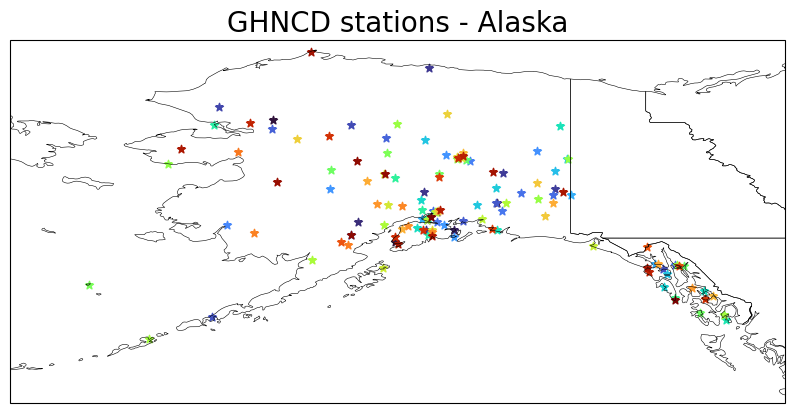

In [ ]:
Tip90=np.where(PP79>=50)[0] 
cmap=cmaps.BlGrYeOrReVi200
proj=ccrs.PlateCarree()
colors=cm.get_cmap('turbo',len(dso['station']))
#colors=cm.get_cmap('turbo',10)

fig, ax = plt.subplots(nrows=1,ncols=1,figsize=(10,11),subplot_kw={'projection':proj})

for ip in Tip90:
  #for ip in range(30,40):  
  ax.scatter(dso['longitude'][ip],dso['latitude'][ip],marker='*',color=colors(ip),label=dso['station'][ip].data.item())

ax.set_extent([lon_min,lon_max,lat_min,lat_max],proj)
ax.add_feature(state_borders,zorder=100,linewidth=0.4,edgecolor='k')
handles, labels = ax.get_legend_handles_labels()
#fig.legend(handles, labels, loc='lower center',ncol=6,bbox_to_anchor=(0.5,-0.02),prop={'size': 10})
ax.set_title('GHNCD stations - Alaska',fontsize=20)

In [154]:
f'Number of station where PP79>0.5 = {len(Tip90)}'

'Number of station where PP79>0.5 = 133'

# TIMESERIES by 10 stations

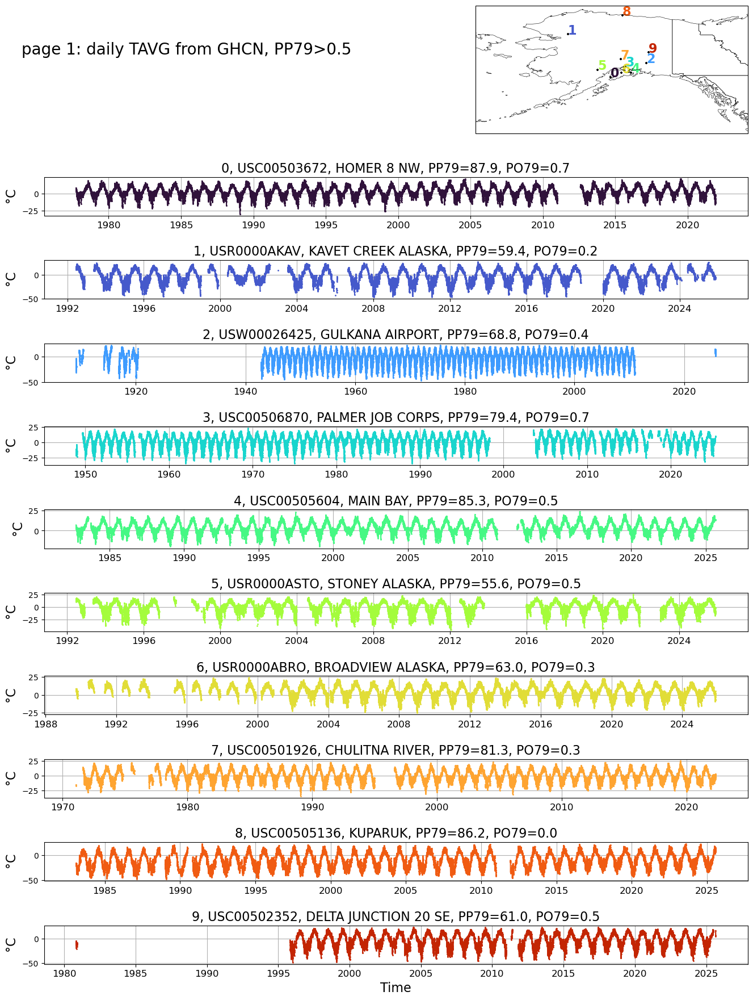

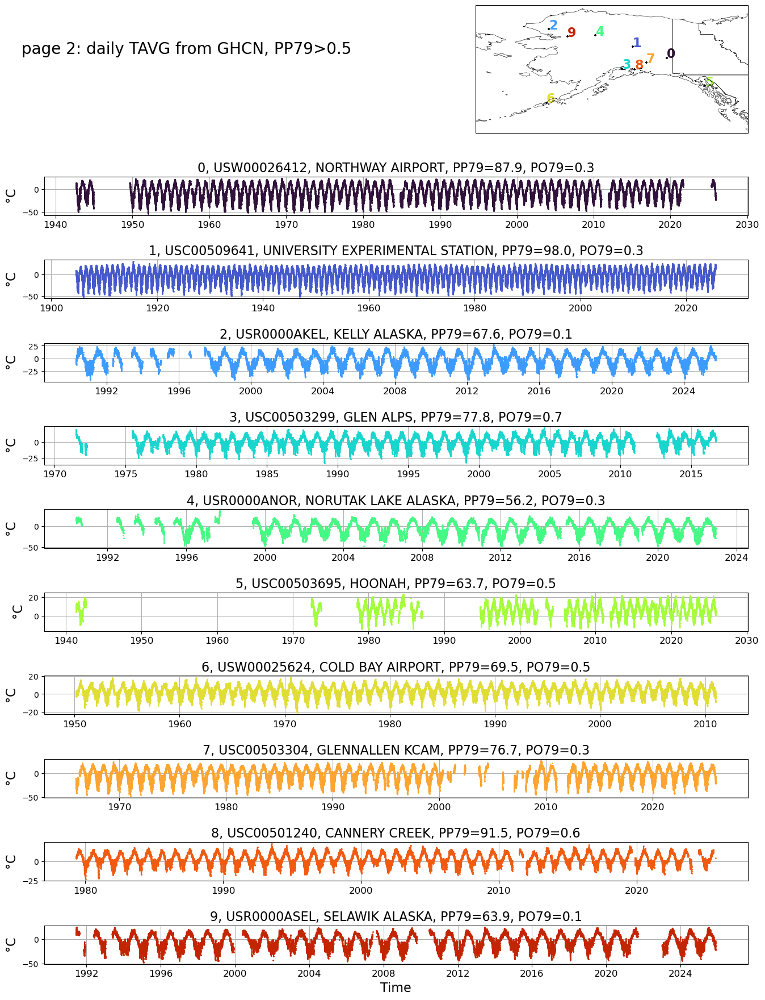

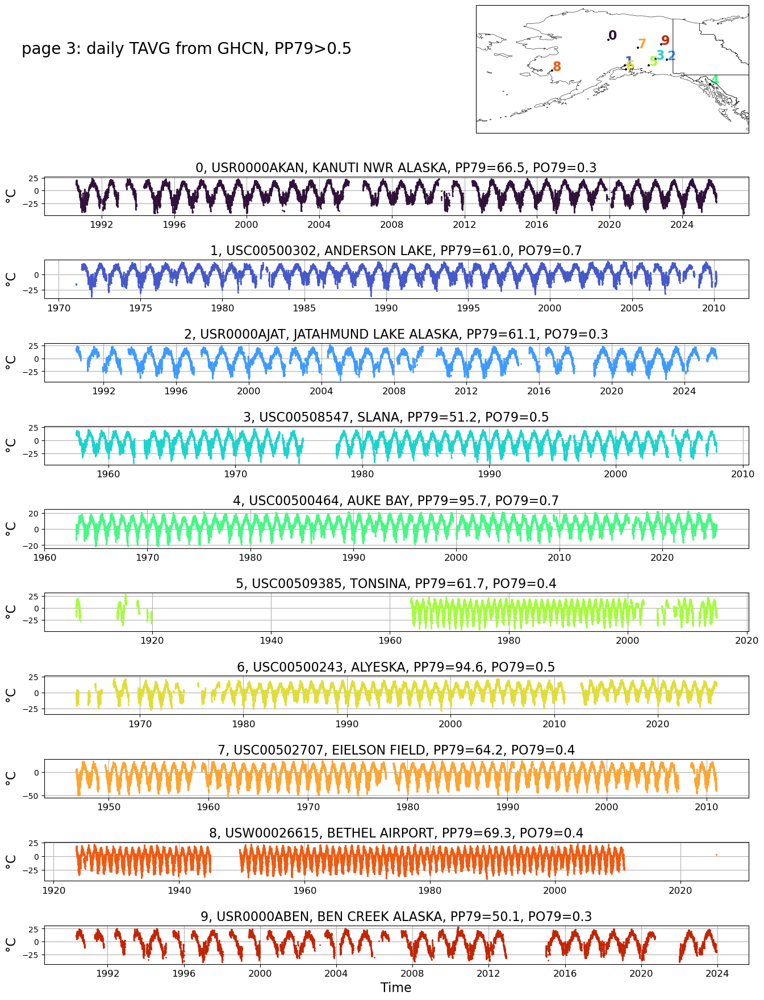

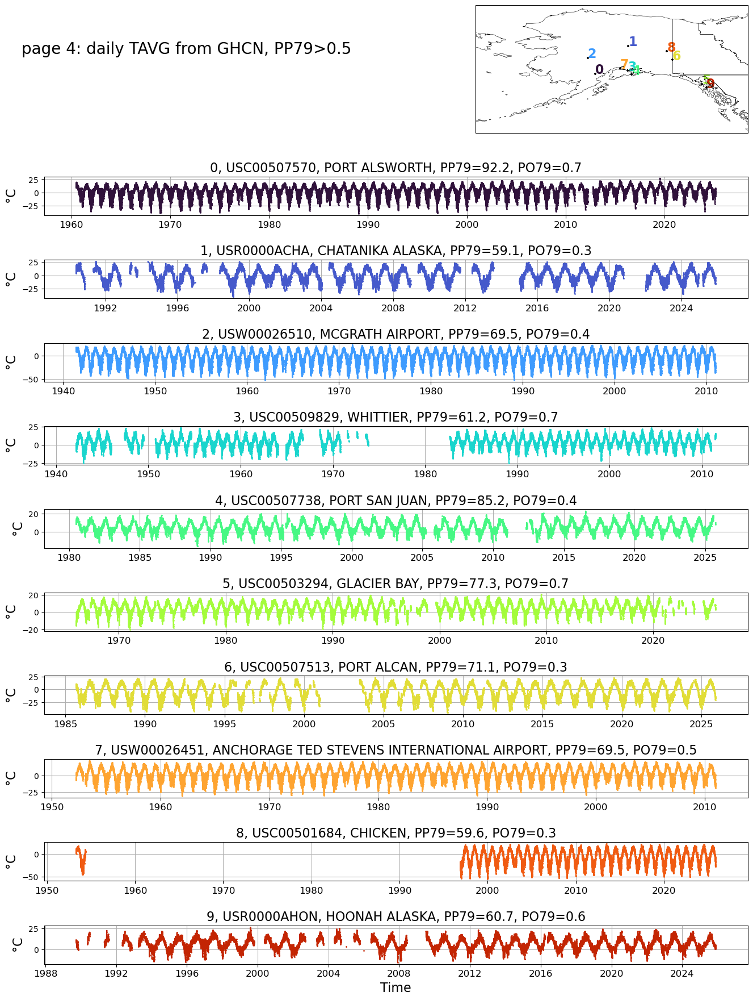

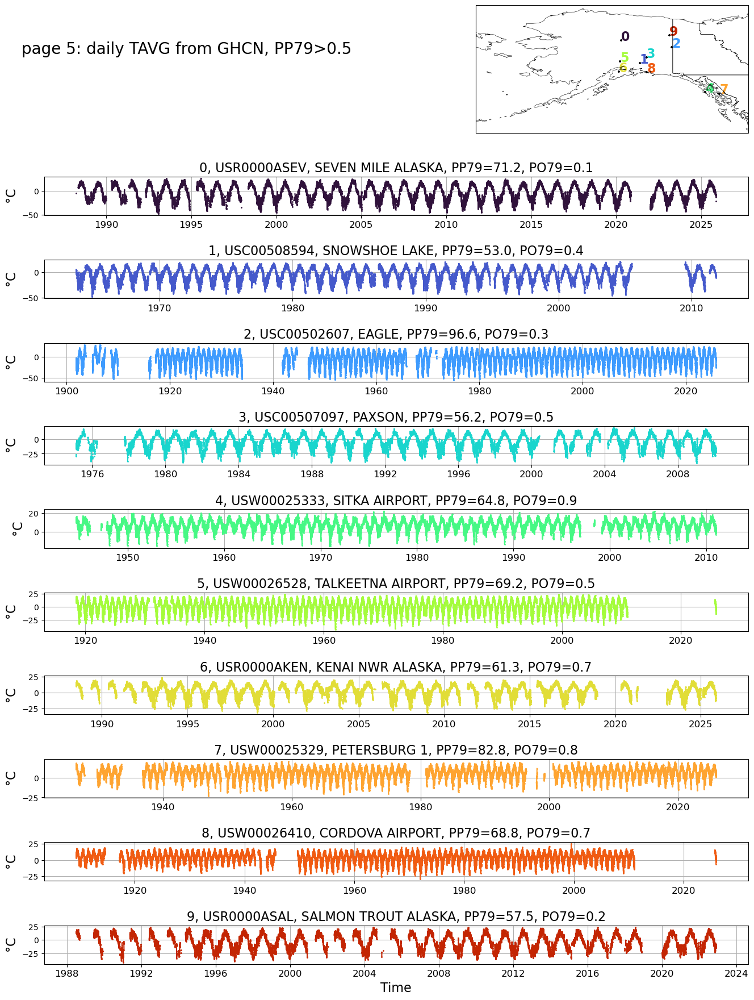

...

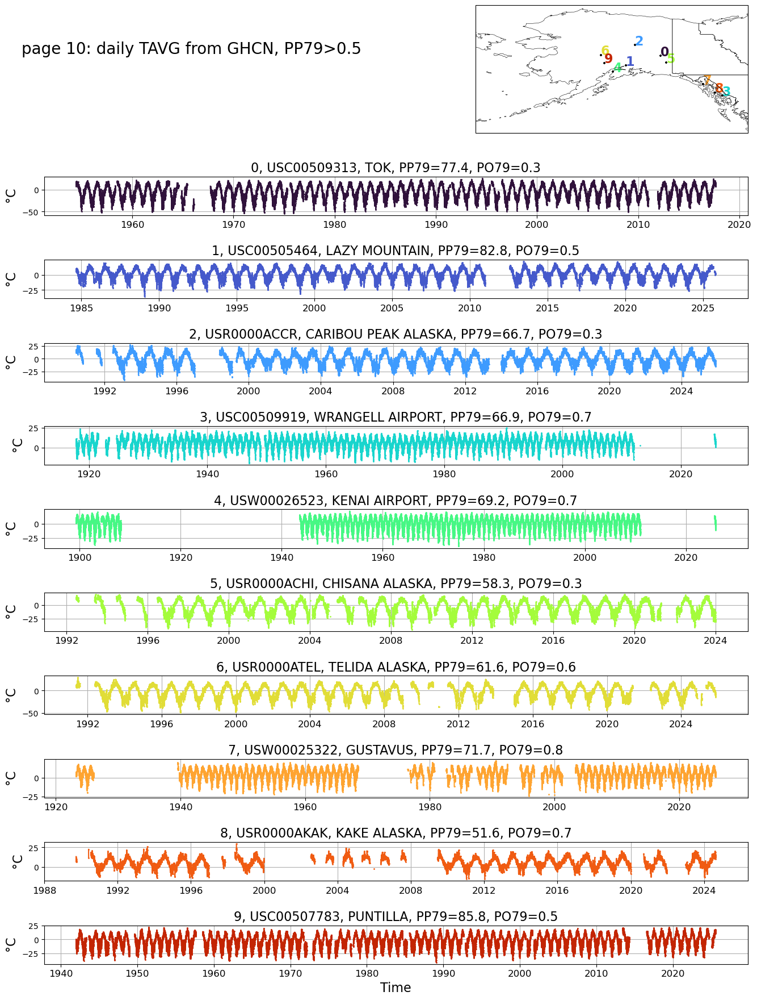

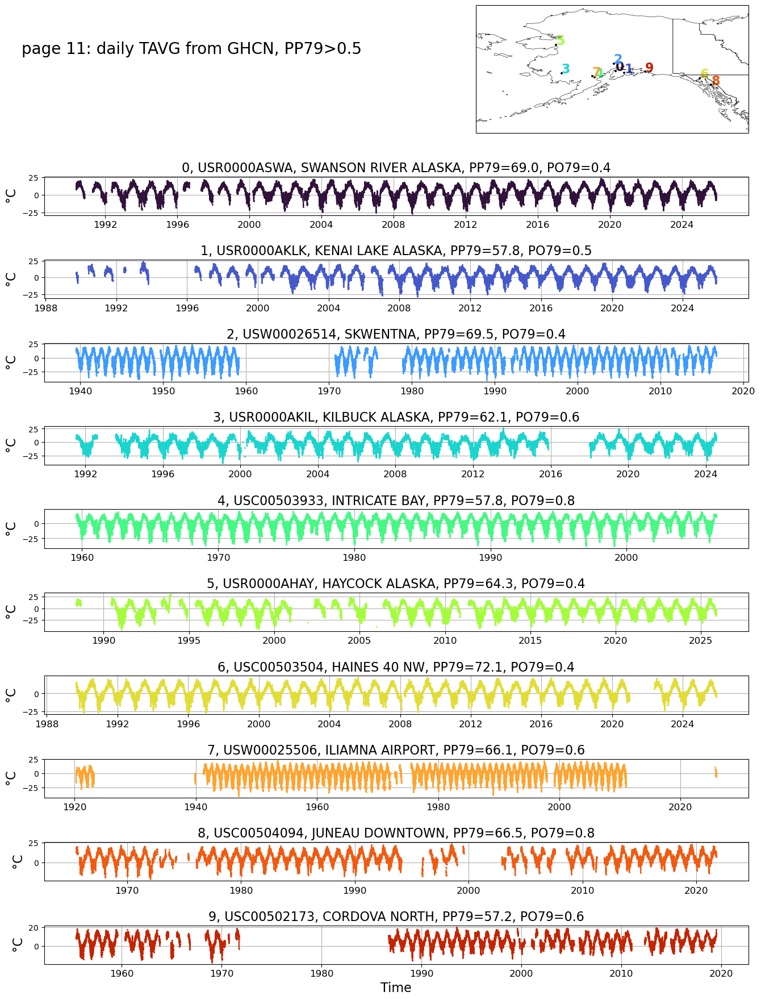

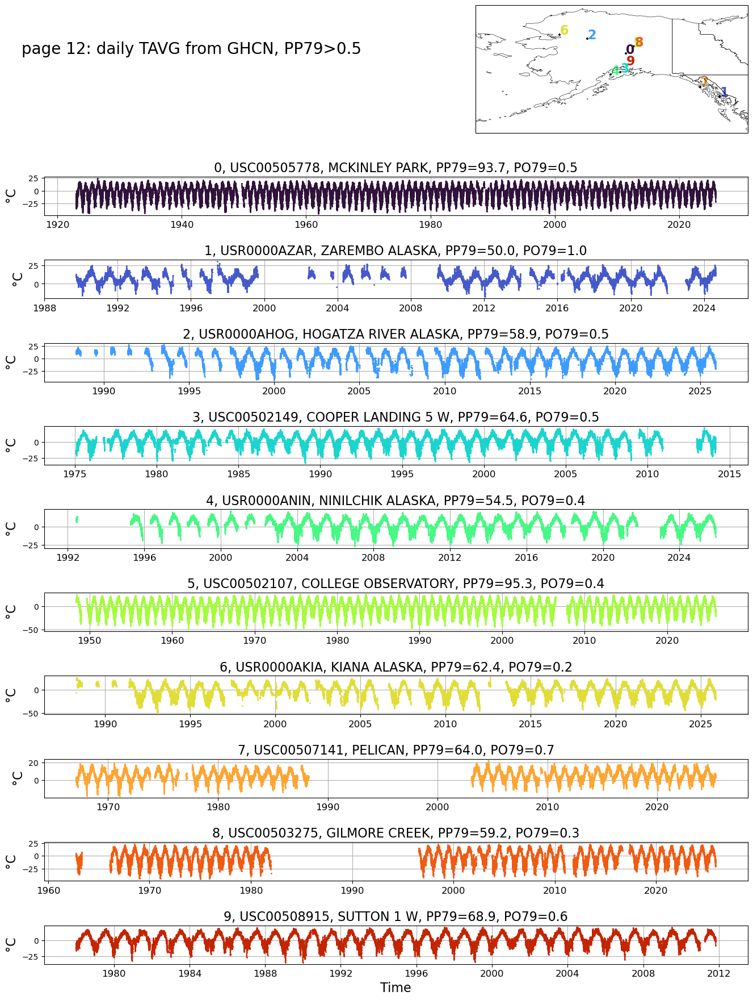

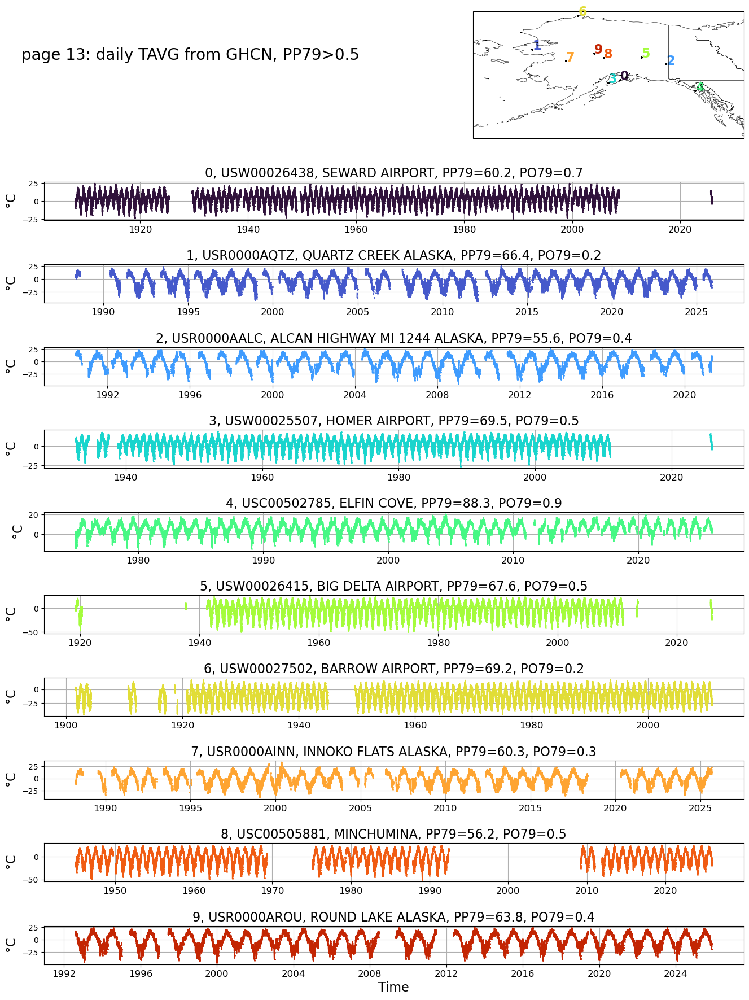

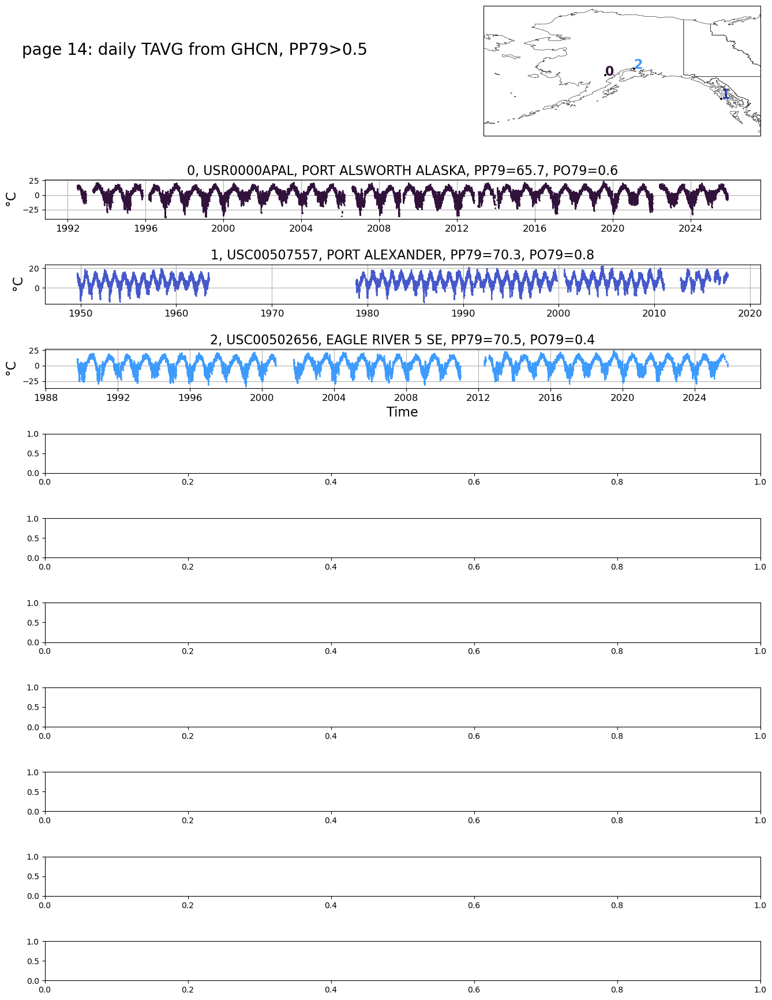

In [152]:
k=1
for ii in range(0,len(Tip90),10):
  fig, ax = plt.subplots(nrows=10,ncols=1,figsize=(16,18))
  colors=cm.get_cmap('turbo',11)
  fig.subplots_adjust(hspace=1.15)
  ax_inset = fig.add_axes([0.6, 0.86, 0.3, 0.25], projection=ccrs.PlateCarree())
  ax_inset.set_extent([lon_min,lon_max,lat_min,lat_max],proj)
  ax_inset.add_feature(state_borders,zorder=100,linewidth=0.4,edgecolor='k')
  for pp in range(ii,ii+10):
    if pp< len(Tip90):
      ip = Tip90[pp]
      ix=pp-ii
      istation = dso.station[ip].data.item() 
      iname = dso.name[ip].data.item().split(',')[0]
      if dso['longitude'][ip]+360<=lon_max:
        ax_inset.scatter(dso['longitude'][ip],dso['latitude'][ip],marker='+',s=10,color='k')
        ax_inset.text(dso['longitude'][ip],dso['latitude'][ip],ix,color=colors(ix),fontsize=16,fontweight='bold')
      yyy = tavg.isel(station=ip)
      ax[ix].plot(dso['time'],yyy,color=colors(ix),marker='o',markersize=1)
      ax[ix].set_ylabel(f'$\degree$C',fontsize=16)  
      ax[ix].set_xticklabels(ax[ix].get_xticklabels(),fontsize=12)  
      ax[ix].set_xlabel('',fontsize=16)
      ax[ix].grid()
      ax[ix].set_title(f'{ix}, {istation}, {iname}, PP79={PP79.isel(station=ip).data.item():.1f}, PO79={PO79.isel(station=ip).data.item():.1f}',fontsize=16)
  ax[ix].set_xlabel('Time',fontsize=16)
  fig.text(0.1,1,f'page {k}: daily TAVG from GHCN, PP79>0.5',fontsize=20)
  k = k+1
  plt.show()

# Compute AFI

In [106]:
def consecutive_10(data):
    xxx = np.split(data, np.where(np.diff(data) >= 10)[0]+1)  
    yyy = [len(ix)>10 for ix in xxx]
    return np.array(yyy).any()

In [112]:
Tip90=np.where(PP79>=50)[0]

In [118]:
afi = tavg.groupby('time.year').mean()*np.nan

for pp in range(0,len(Tip90)):
  tip = tavg.isel(station=Tip90[pp])
  tip = tip.where(np.isnan(tip)==False,drop=True)
  yearb = tip.time.dt.year[0].item()
  yeare = tip.time.dt.year[-1].item()
  istation = tip.station.data
  if tip.time.dt.month[0].item() >=10 & tip.time.dt.day[0].item() >1:
    yearbb = yearb+2   
  else:
    yearbb = yearb+1

  for iyear in range(yearbb,yeare):
    dfiy = pd.date_range(f'{iyear-1}-10-01',f'{iyear}-09-30', freq="D")
    tipiy = tip.sel(time=slice(f'{iyear-1}-10-01',f'{iyear}-09-30'))
    if len(tipiy)/len(dfiy) >0.75:
      rtipiy = tipiy.resample(time="1D").mean()

      # check if missing consecutive days <10
      ttt=np.where(np.isnan(rtipiy)==True)[0]
      if consecutive_10(ttt)==False:
        # linear interpolation 
        lrtipiy = rtipiy.interpolate_na(dim='time',method="linear")

        afi.loc[{'year':iyear,'station':istation}] = calculate_bilotta_afi(lrtipiy, units='C')

In [119]:
nb79 = xr.where(np.isnan(afi)==False,1,0).sel(year=slice(1979,2025)).sum('year')  

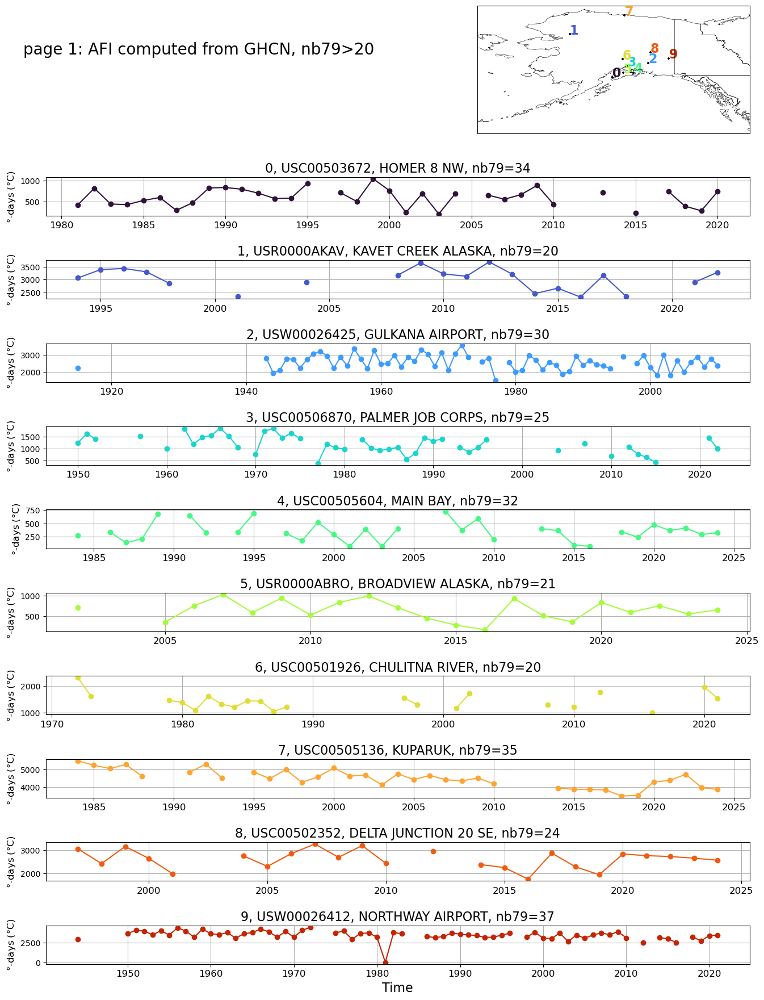

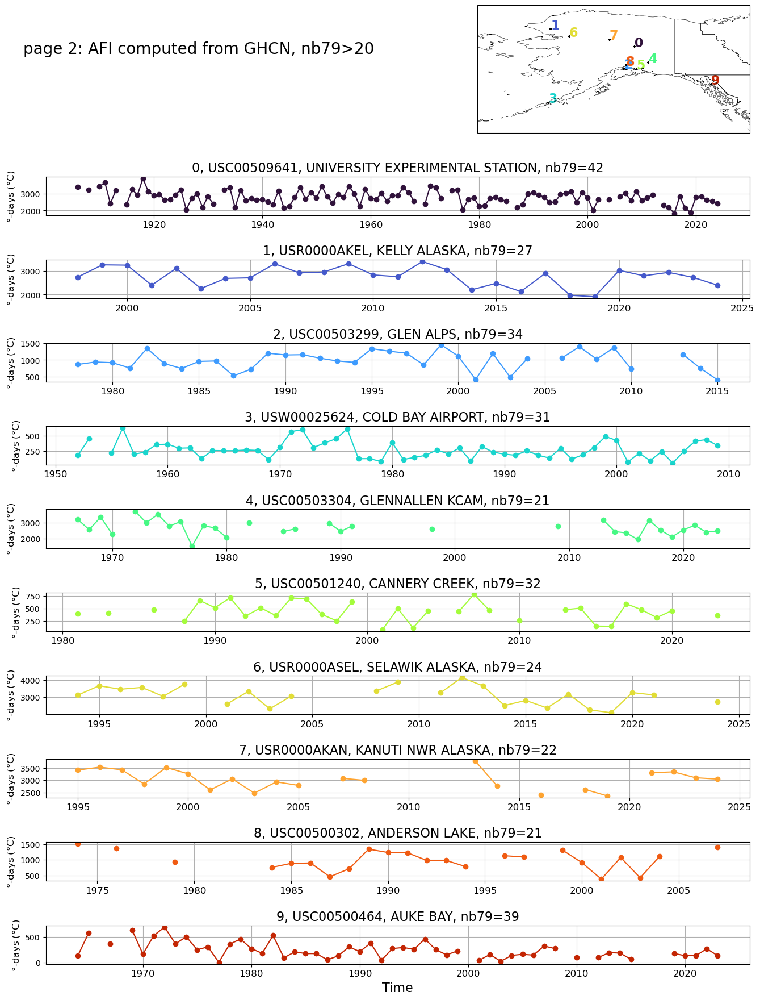

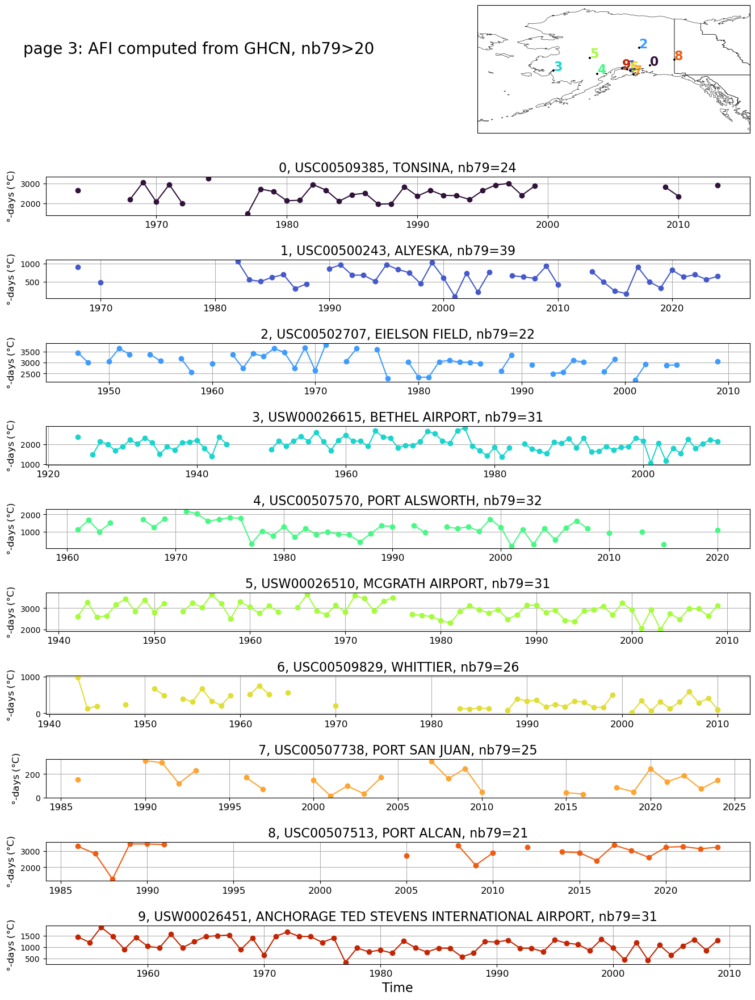

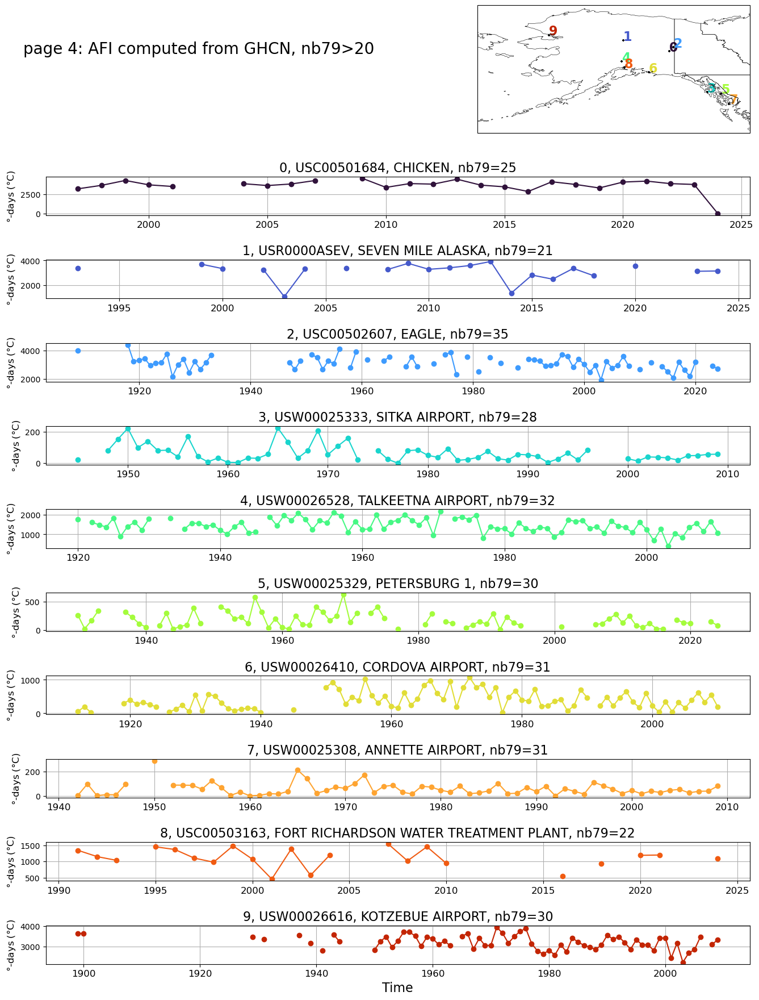

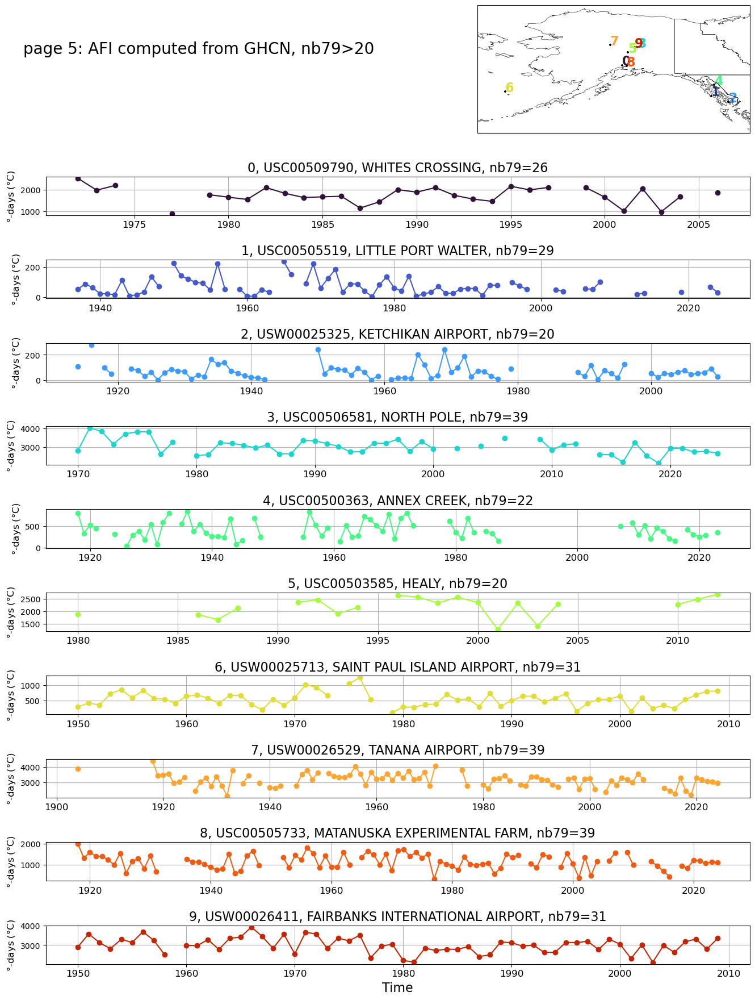

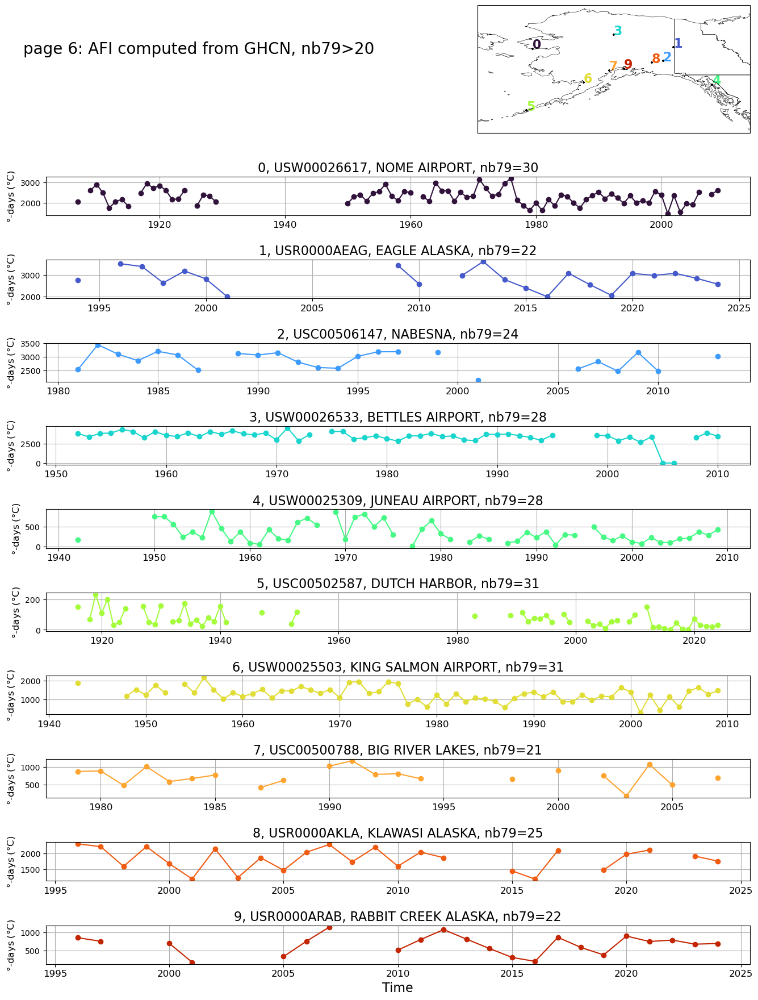

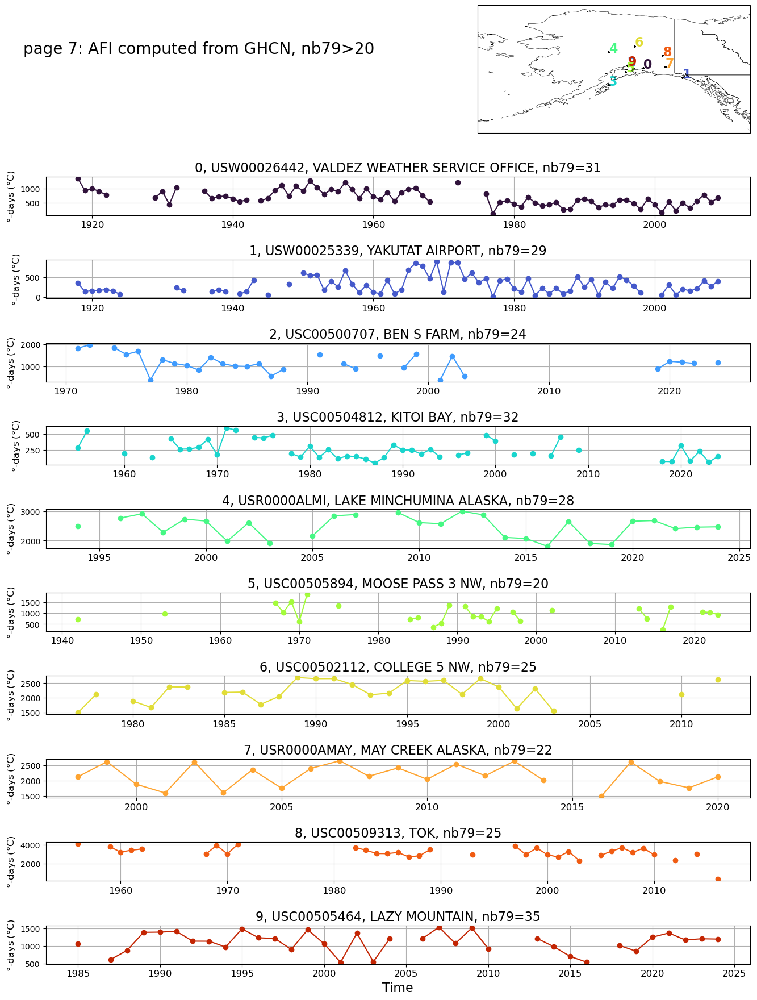

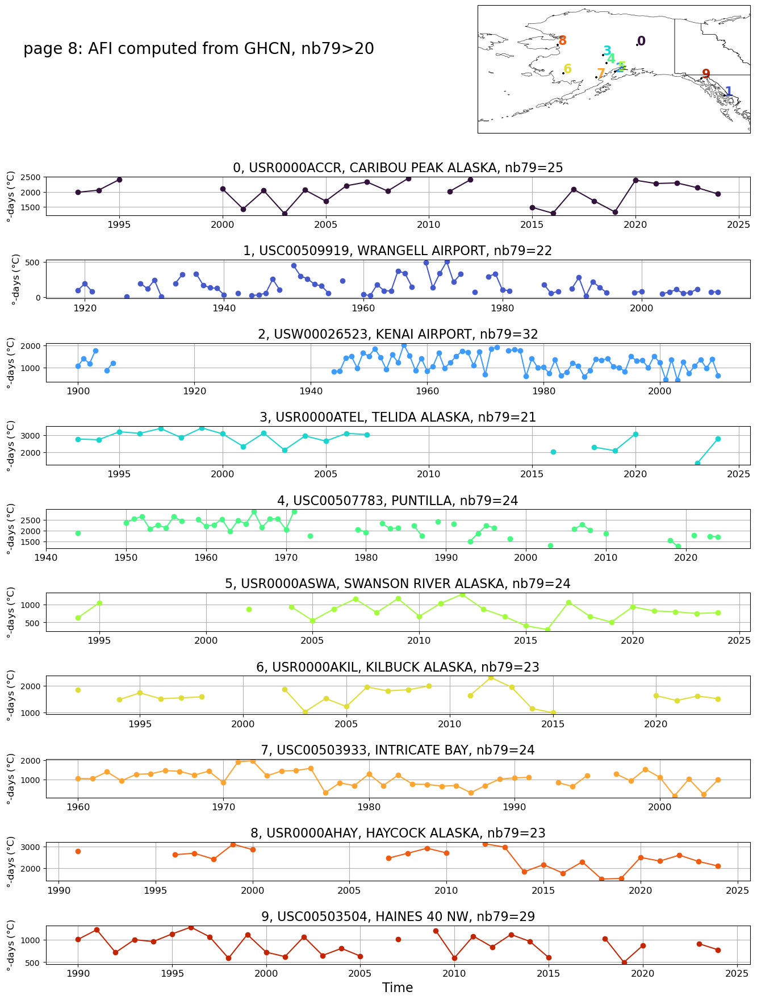

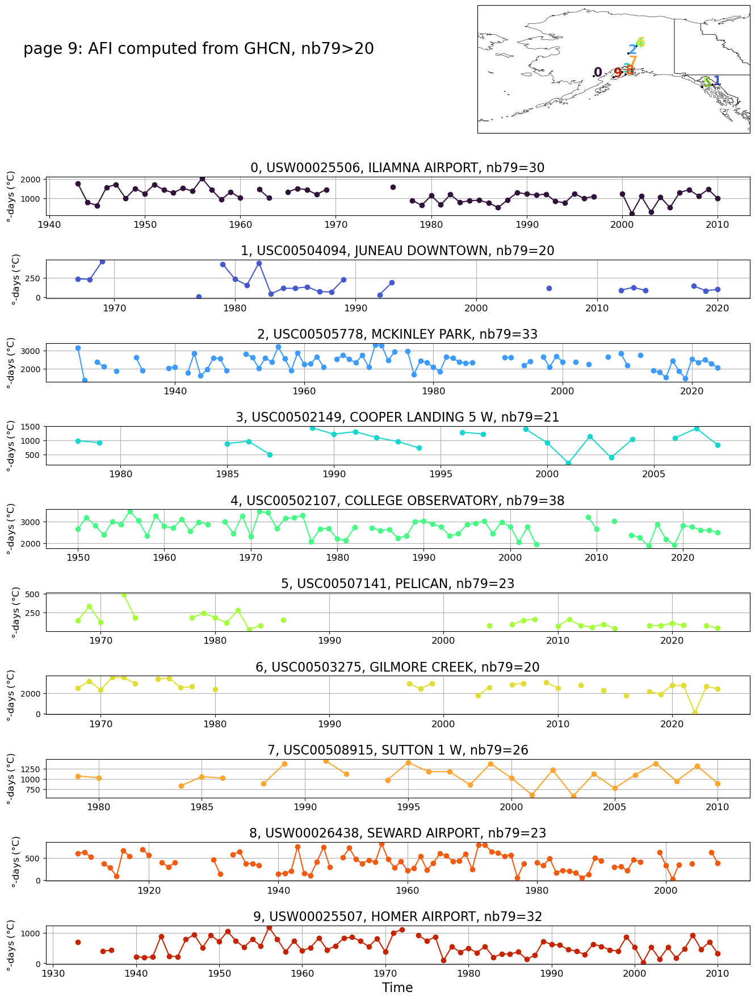

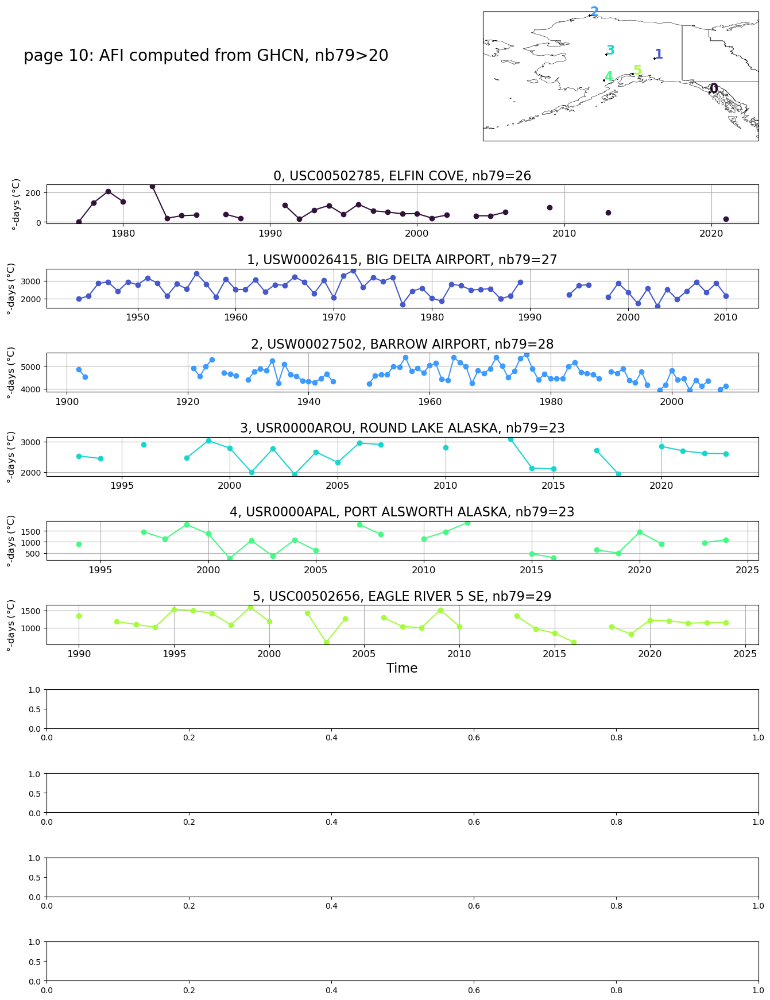

In [153]:
k=1
Tip20=np.where(nb79>=20)[0]
for ii in range(0,len(Tip20),10):
  fig, ax = plt.subplots(nrows=10,ncols=1,figsize=(16,18))
  colors=cm.get_cmap('turbo',11)
  fig.subplots_adjust(hspace=1.15)
  ax_inset = fig.add_axes([0.6, 0.86, 0.3, 0.25], projection=ccrs.PlateCarree())
  ax_inset.set_extent([lon_min,lon_max,lat_min,lat_max],proj)
  ax_inset.add_feature(state_borders,zorder=100,linewidth=0.4,edgecolor='k')
  for pp in range(ii,ii+10):
    if pp< len(Tip20):
      ip = Tip20[pp]
      ix=pp-ii
      istation = nb79.station[ip].data.item() 
      iname = dso.name.sel(station=istation).data.item().split(',')[0]
      if dso['longitude'][ip]+360<=lon_max:
        ax_inset.scatter(dso['longitude'][ip],dso['latitude'][ip],marker='+',s=10,color='k')
        ax_inset.text(dso['longitude'][ip],dso['latitude'][ip],ix,color=colors(ix),fontsize=16,fontweight='bold')
      afi.sel(station=istation).plot(ax=ax[ix],color=colors(ix),marker='o')
      ax[ix].set_ylabel(f'$\degree$-days ($\degree$C)',fontsize=12)  
      ax[ix].set_xticklabels(ax[ix].get_xticklabels(),fontsize=12)  
      ax[ix].set_xlabel('',fontsize=16)
      ax[ix].grid()
      ax[ix].set_title(f'{ix}, {istation}, {iname}, nb79={nb79.sel(station=istation).data.item():d}',fontsize=16)
  ax[ix].set_xlabel('Time',fontsize=16)
  fig.text(0.1,1,f'page {k}: AFI computed from GHCN, nb79>20',fontsize=20)
  k = k+1
  plt.show()

In [155]:
f'Number of stations where nb79 >= 20: {len(Tip20)}'

'Number of stations where nb79 >= 20: 96'

In [144]:
afi.name='air_freezing_index'
afi.attrs['units']=f'degree-days ("{units}")'
afi.attrs['long_name']='Air Freezing Index (Bilotta et al. method)'
afi.attrs['description']='Difference between highest and lowest extrema points of cumulative FDD.'
afi.attrs['criteria']='Defined if 2/3 of daily tavg present during cold season and less than 10 consecutive days of missing tavg.'

In [145]:
nb79.attrs['description']='Number of Defined AFI since 1979'

In [146]:
dsout = afi.where(np.isnan(afi)==False,drop=True).to_dataset(name='afi')

In [147]:
dsout = dsout.merge({'nb79':nb79.sel(station=dsout['station'])})

In [148]:
dsout

<xarray.Dataset>
Dimensions:  (station: 133, year: 126)
Coordinates:
  * station  (station) object 'USC00503672' 'USR0000AKAV' ... 'USC00502656'
  * year     (year) int64 1899 1900 1901 1902 1903 ... 2020 2021 2022 2023 2024
Data variables:
    afi      (station, year) float64 nan nan nan ... 1.151e+03 1.151e+03
    nb79     (station) int64 34 20 30 25 32 18 21 20 ... 27 28 6 18 23 23 15 29

In [149]:
dsout.to_netcdf('/data/ghervieux/AFI/ghcnd_afi_AK.nc')